## Imports

In [1]:
# Python libraries
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import Axes3D  # Importing the 3D plotting module
import matplotlib.colors as mcolors
from matplotlib.colors import TwoSlopeNorm
from sklearn.decomposition import PCA
from numpy import linalg as la
from scipy.spatial import distance_matrix

# Transformers libraries
import torch
import transformers
from transformers import AutoTokenizer, AutoModelForCausalLM

# Neighborhood analysis
import faiss
from sklearn.manifold import TSNE

# Surface reconstruction
from scipy.spatial import Delaunay

from my_functions import pca, svd_and_pca, apply_TSNE

/home/ubuntu/miniconda3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Analysis

In [19]:
model_id = 'openai-community/gpt2'
tokenizer = AutoTokenizer.from_pretrained(model_id)
model = AutoModelForCausalLM.from_pretrained(model_id, output_attentions=True)

df = pd.read_pickle("/home/ubuntu/Project/output/word_to_vector.pkl")

In [3]:
attention = torch.load("output/decoder/decoder_1/AttentionHeads.pt")

In [4]:
c_attn = model.transformer.h[0].attn.c_attn
attention_weights = c_attn.weight
attention_bias = c_attn.bias

print("Attention weights' shape: ", attention_weights.shape)
Wq = attention_weights[:, :768].detach().numpy()
Wk = attention_weights[:, 768:-768].detach().numpy()
Wv = attention_weights[:, -768:].detach().numpy()

Attention weights' shape:  torch.Size([768, 2304])


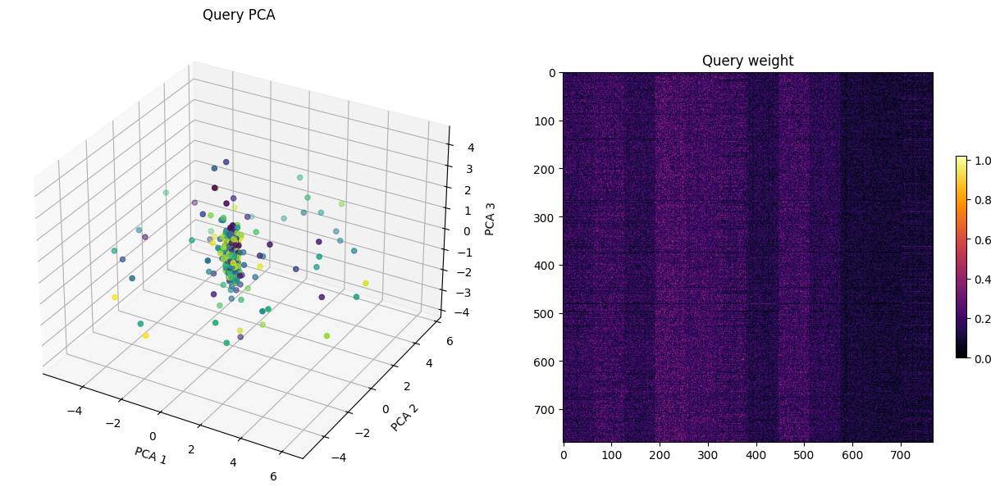

In [5]:
## PCA ANAYLISIS OF THE MATRIX 
pca(Wq, 'Query')

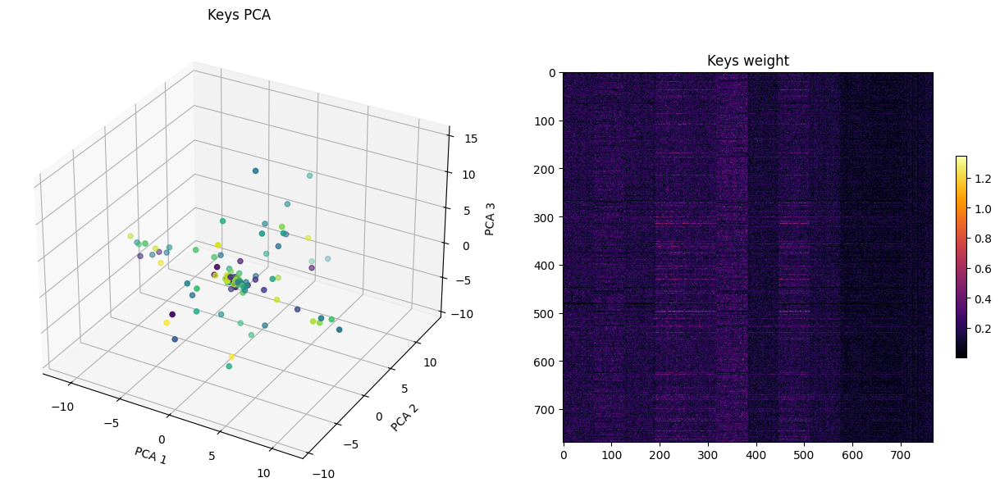

In [6]:
pca(Wk, 'Keys')

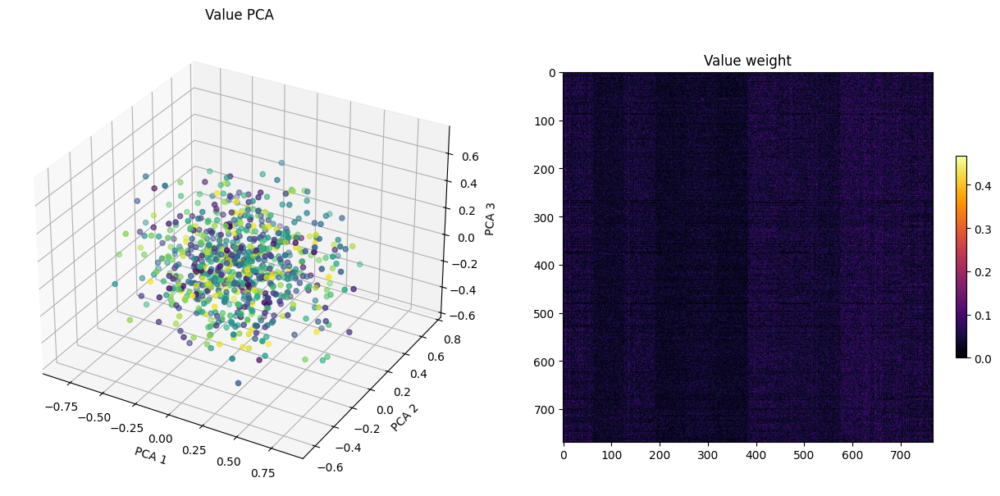

In [7]:
pca(Wv, 'Value')

In [8]:
QKV_representation = torch.load("output/decoder/decoder_1/QKV_representation.pt")
print(QKV_representation.shape)

torch.Size([1, 308, 2304])


In [9]:
QKV_representation_matrix = QKV_representation.detach().numpy()[0,:,:]
print(QKV_representation_matrix.shape)

(308, 2304)


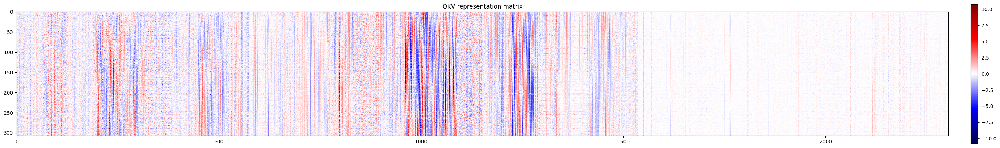

In [10]:
plt.figure(1, (40,20))
norm = TwoSlopeNorm(vmin=-np.abs(QKV_representation_matrix).max(), vmax=np.abs(QKV_representation_matrix).max(), vcenter=0)
plt.imshow(QKV_representation_matrix, cmap='seismic', norm=norm)
plt.colorbar(shrink=0.25, pad=0.02)
plt.title('QKV representation matrix')
plt.show()

##### Split in 12 attention heads

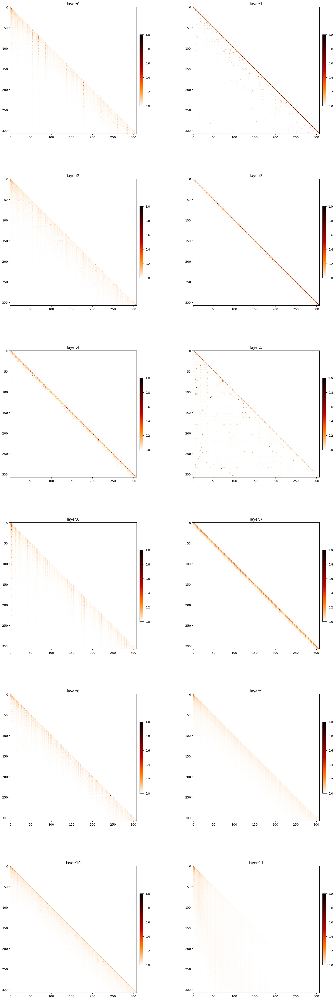

In [11]:
Attention_heads = torch.load("output/decoder/decoder_1/AttentionHeads.pt").detach().numpy()[0,]

fig, axs = plt.subplots(6, 2, figsize=(20,60))

norm = TwoSlopeNorm(vmin=0, vmax=1, vcenter=0.5)

for i in range(6):
    for j in range(2):
        cax = axs[i,j].imshow(Attention_heads[2*i+j,], cmap='gist_heat_r', norm=norm)
        fig.colorbar(cax, ax=axs[i,j], shrink=0.5, pad=0.02)
        axs[i,j].set_title('layer:'+str(2*i+j))
    
plt.show()

#### Concatenate and normalize

At this point the model calculates the values and apply a rotation matrix called c_proj to each token

In [12]:
attn_c_proj_weight = model.transformer.h[0].attn.c_proj.weight.detach().numpy()
attn_c_proj_weight.shape

(768, 768)

In [13]:
attn_c_proj_bias = model.transformer.h[0].attn.c_proj.bias.detach().numpy().flatten()
attn_c_proj_bias.shape

(768,)

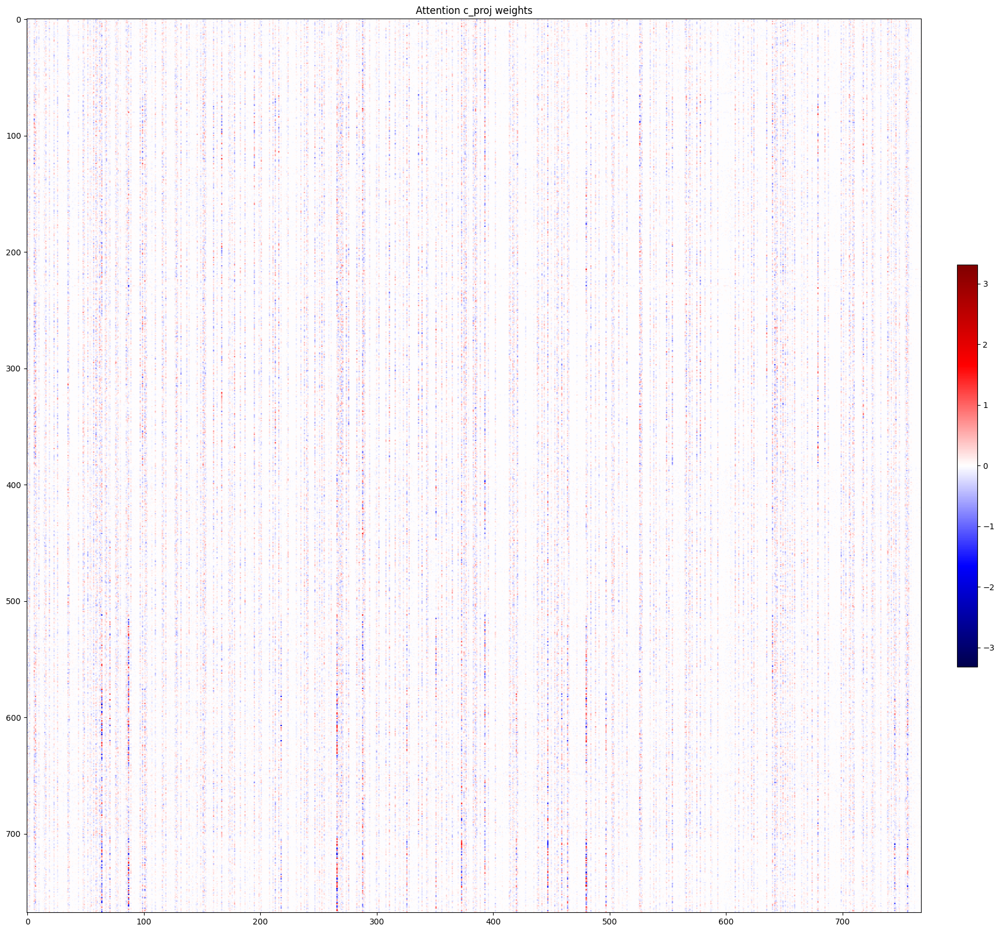

In [14]:
plt.figure(1, (40,20))
norm = TwoSlopeNorm(vmin=-np.abs(attn_c_proj_weight).max(), vmax=np.abs(attn_c_proj_weight).max(), vcenter=0)

plt.imshow(attn_c_proj_weight, cmap='seismic', norm=norm)
plt.colorbar(shrink=0.45, pad=0.02)
plt.title('Attention c_proj weights')
plt.show()

In [15]:
Concat = torch.load("output/decoder/decoder_1/AttentionProj.pt").detach().numpy()[0,]
Concat.shape

(308, 768)

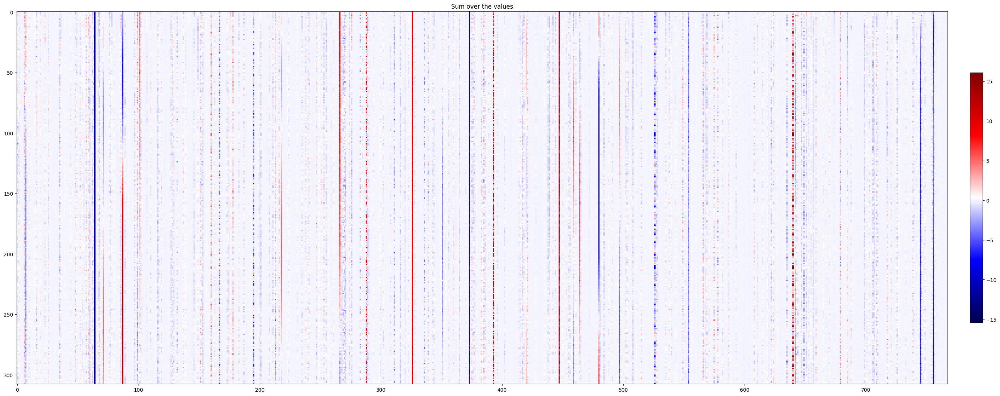

In [16]:
plt.figure(1, (40,20))
plt.imshow(Concat, cmap='seismic')
plt.colorbar(shrink=0.45, pad=0.02)
plt.title('Sum over the values')
plt.show()

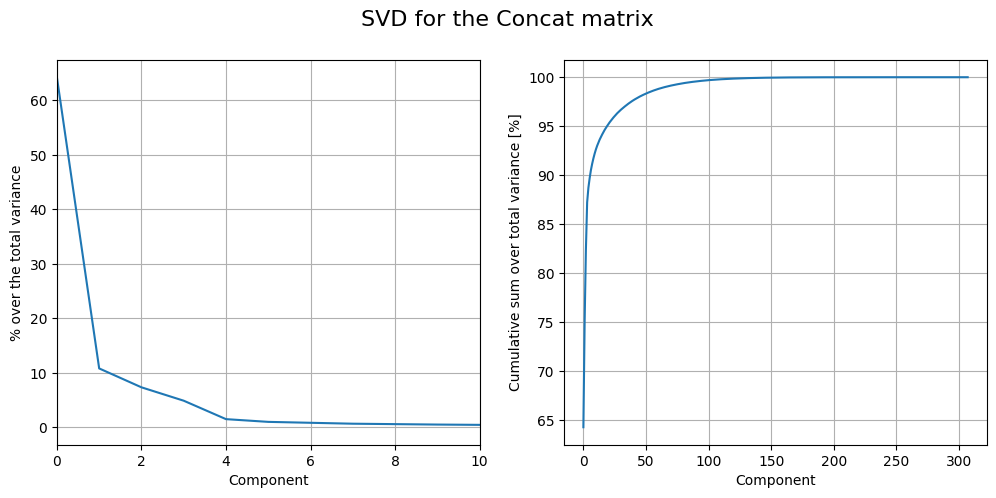

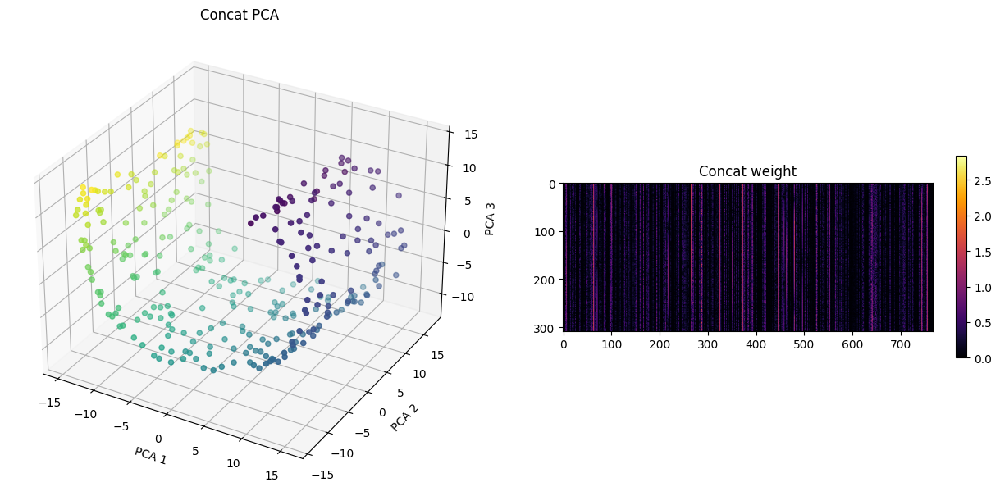

In [17]:
svd_and_pca(Concat, 'Concat')

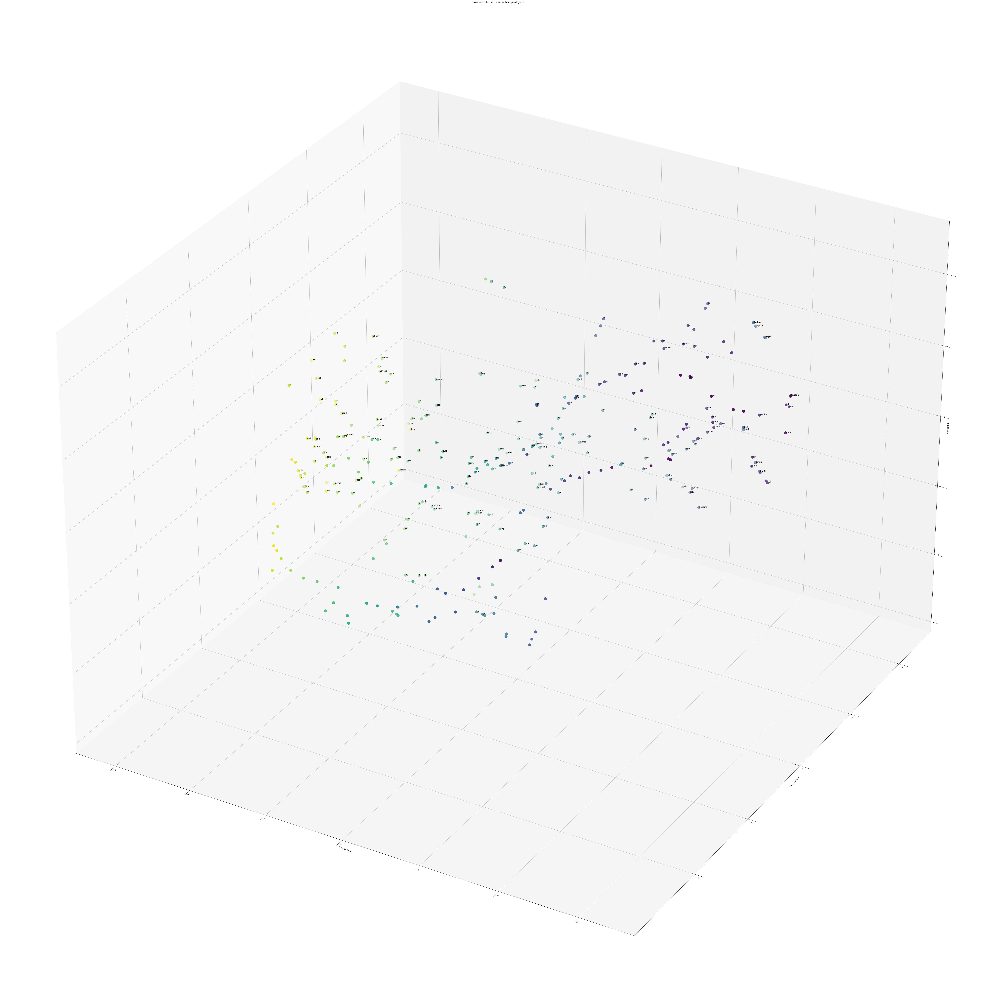

In [20]:
apply_TSNE(df, Concat)

#### Second normalization

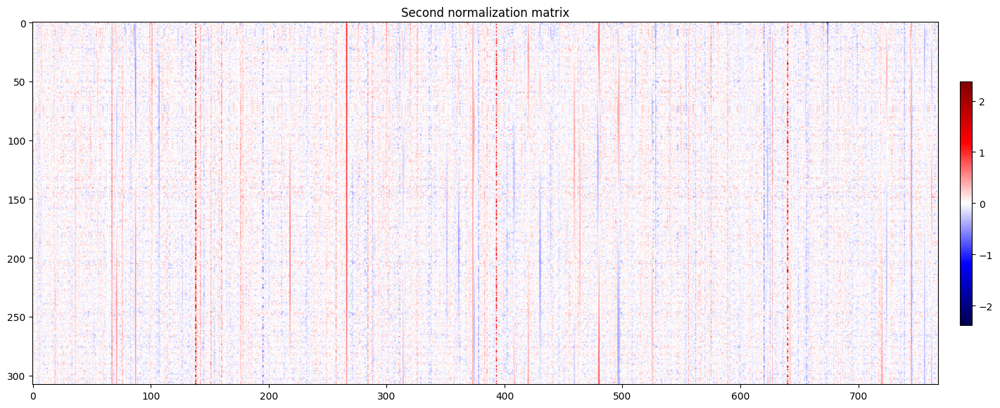

In [22]:
second_normalization = torch.load("output/decoder/decoder_1/SecondNormalization.pt").detach().numpy()[0]

norm = TwoSlopeNorm(vmin=-np.abs(second_normalization).max(), vmax=np.abs(second_normalization).max(), vcenter=0)

plt.figure(1, (20,10))
plt.imshow(second_normalization, cmap='seismic', norm = norm)
plt.colorbar(shrink=0.45, pad=0.02)
plt.title('Second normalization matrix')
plt.show()

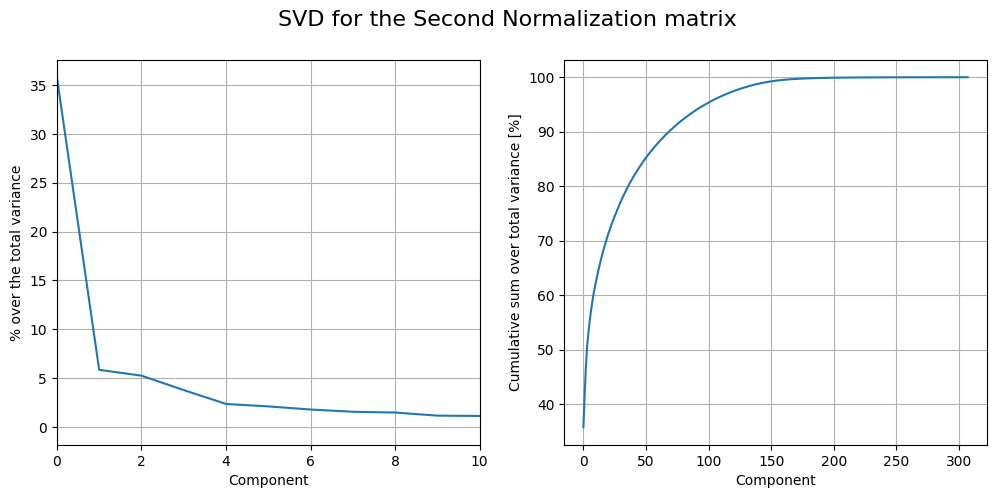

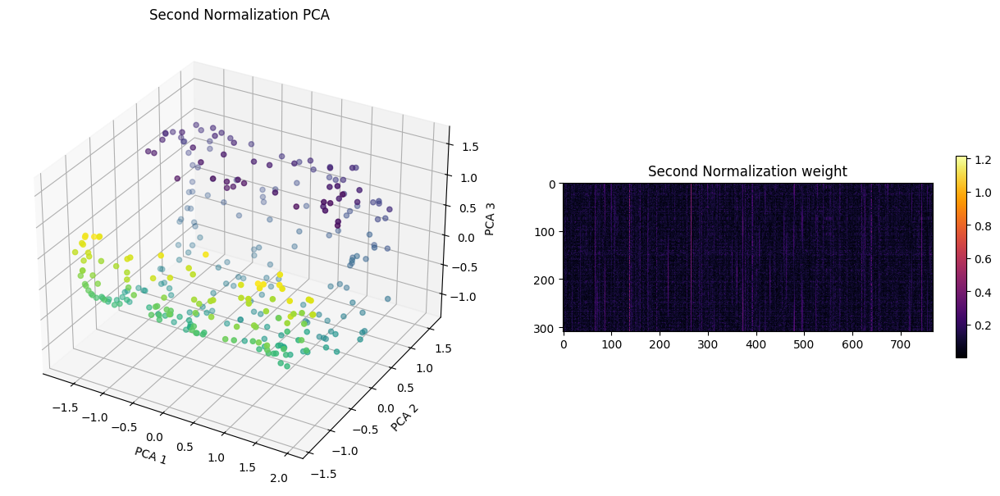

In [25]:
svd_and_pca(second_normalization, 'Second Normalization')

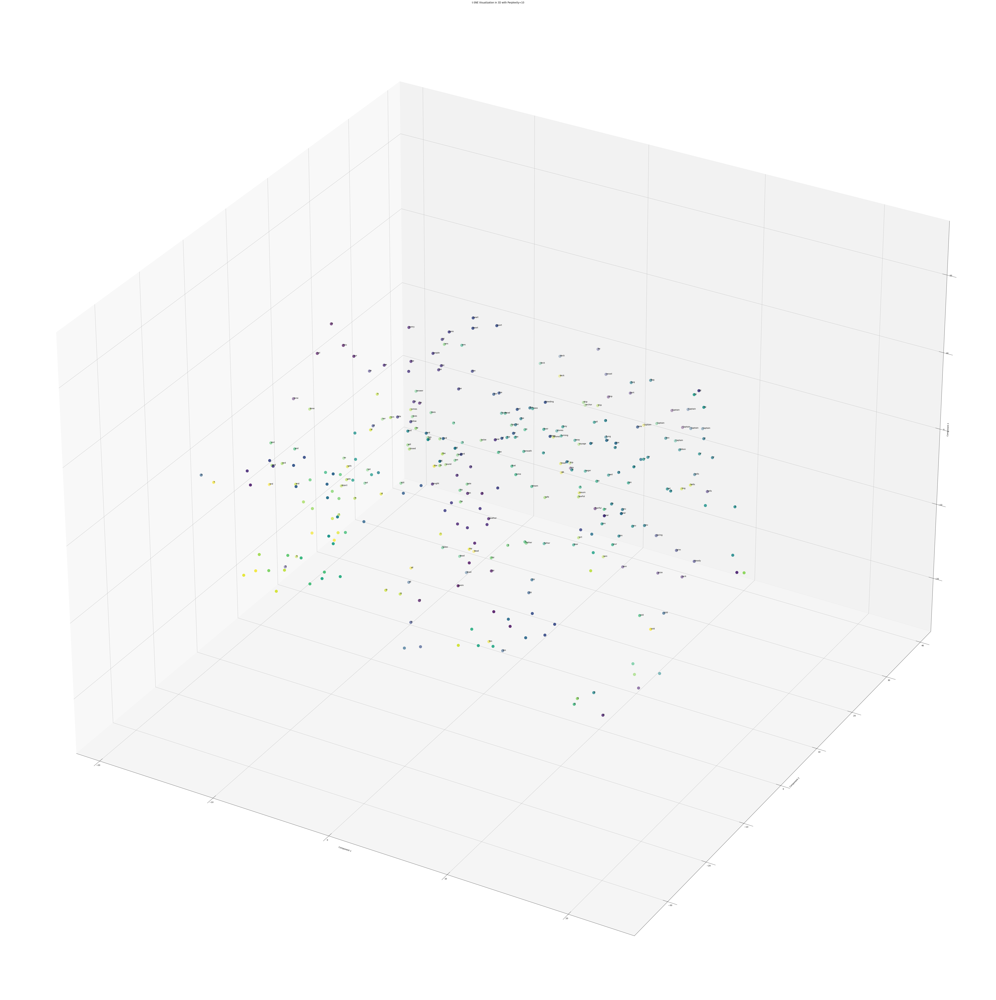

In [23]:
apply_TSNE(df, second_normalization)